#### Setting up

In [ ]:
# !pip install labelme tensorflow tensorflow-gpu opencv-python matplotlib albumentations

In [1]:
import os
import time
import uuid #to create unique identifiers
import cv2
import tensorflow as tf
import json
import numpy as np
from matplotlib import pyplot as plt
import albumentations as alb
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Dense, GlobalMaxPooling2D
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import load_model
import tkinter as tk
from PIL import Image, ImageTk

C:\Users\nadha\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\nadha\AppData\Roaming\Python\Python311\site-packages\albumentations\__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.24 (you have 1.4.23). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


#### Collecting images using OpenCV 

In [2]:
IMAGES_PATH = os.path.join('data','images')
number_images = 30

In [4]:
cap = cv2.VideoCapture(0)
for imgnum in range(number_images):
    print('Collecting image {}'.format(imgnum))
    ret, frame = cap.read()
    imgname = os.path.join(IMAGES_PATH,f'{str(uuid.uuid1())}.jpg')
    cv2.imwrite(imgname, frame)
    cv2.imshow('frame', frame)
    time.sleep(0.5)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

In [7]:
!labelme

2024-12-25 19:20:16,890 [INFO   ] __init__:get_config:67- Loading config file from: C:\Users\nadha\.labelmerc


Labelme is an open-source graphical image annotation tool written in Python. It's commonly used to create datasets for computer vision tasks like object detection and segmentation.

In [8]:
# Avoid OOM errors by setting GPU Memory Consumption Growth
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus: 
    tf.config.experimental.set_memory_growth(gpu, True)
    


prevents the GPU from pre-allocating all of its memory at once. Instead, it allocates memory as needed during training, avoiding Out-of-Memory (OOM) errors.

In [9]:
tf.config.list_physical_devices('GPU')

[]

#### Loading Images 

Create a folder named 'data' in the same folder as in the notebook. And create subfolders as 'images' and 'labels'

In [10]:
images = tf.data.Dataset.list_files('data\\images\\*.jpg')

In [11]:
images.as_numpy_iterator().next()

b'data\\images\\4ee75b5c-c2c6-11ef-bcc9-141333545ac4.jpg'

In [12]:
def load_image(x): 
    byte_img = tf.io.read_file(x)
    img = tf.io.decode_jpeg(byte_img)
    return img

In [13]:
images = images.map(load_image) #load image function to each image using map function 

In [14]:
images.as_numpy_iterator().next()

array([[[165, 167, 166],
        [164, 166, 165],
        [164, 166, 165],
        ...,
        [173, 173, 173],
        [173, 173, 173],
        [173, 173, 173]],

       [[164, 166, 165],
        [164, 166, 165],
        [164, 166, 165],
        ...,
        [173, 173, 173],
        [173, 173, 173],
        [173, 173, 173]],

       [[164, 166, 165],
        [164, 166, 165],
        [165, 167, 166],
        ...,
        [172, 172, 172],
        [172, 172, 172],
        [172, 172, 172]],

       ...,

       [[138, 121,  78],
        [137, 120,  77],
        [135, 118,  74],
        ...,
        [ 71,  67,  58],
        [ 90,  84,  72],
        [100,  92,  79]],

       [[141, 117,  79],
        [139, 116,  75],
        [137, 116,  71],
        ...,
        [123, 121, 100],
        [128, 121,  93],
        [130, 119,  89]],

       [[140, 114,  77],
        [139, 114,  74],
        [138, 116,  69],
        ...,
        [122, 118,  91],
        [125, 116,  83],
        [128, 116,  78]]

In [15]:
type(images)

tensorflow.python.data.ops.map_op._MapDataset

In [16]:
image_generator = images.batch(4).as_numpy_iterator()

In [17]:
plot_images = image_generator.next()

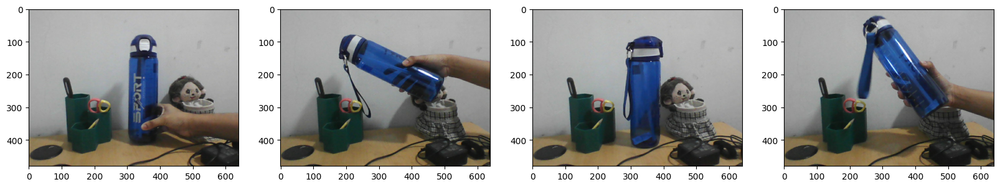

In [18]:
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, image in enumerate(plot_images):
    ax[idx].imshow(image) 
plt.show()

#### Splitting Data

Create 3 folders as train,test and val. And create 'images' and labels' folder in those seperately and manually split the images into those 3 folders. 
(4:1:1)

In [19]:
for folder in ['train','test','val']:
    for file in os.listdir(os.path.join('data', folder, 'images')):
        
        filename = file.split('.')[0]+'.json'
        existing_filepath = os.path.join('data','labels', filename)
        if os.path.exists(existing_filepath): 
            new_filepath = os.path.join('data',folder,'labels',filename)
            os.replace(existing_filepath, new_filepath)      

#### Image Augmentation

Albumentations is a powerful and flexible Python library for image augmentation, commonly used in computer vision tasks. It provides a wide range of augmentation techniques to improve the generalization and robustness of machine learning models.

In [20]:
augmentor = alb.Compose([alb.RandomCrop(width=450, height=450), 
                         alb.HorizontalFlip(p=0.5), 
                         alb.RandomBrightnessContrast(p=0.2),
                         alb.RandomGamma(p=0.2), 
                         alb.RGBShift(p=0.2), 
                         alb.VerticalFlip(p=0.5)], 
                       bbox_params=alb.BboxParams(format='albumentations', 
                                                  label_fields=['class_labels']))

C:\Users\nadha\AppData\Local\Programs\Python\Python311\Lib\site-packages\pydantic\main.py:426: UserWarning: Pydantic serializer warnings:
  Expected `dict[str, any]` but got `UniformParams` with value `UniformParams(noise_type=...6, 0.0784313725490196)])` - serialized value may not be as expected
  return self.__pydantic_serializer__.to_python(


In [21]:
img = cv2.imread(os.path.join('data','train', 'images','37dde3ef-c2c6-11ef-b5ff-141333545ac4.jpg'))

In [22]:


file_path = os.path.join('data', 'train', 'labels', '37dde3ef-c2c6-11ef-b5ff-141333545ac4.json')
with open(file_path, 'r') as f:
    label = json.load(f)


In [23]:
label['shapes'][0]['points']

[[239.90740740740742, 71.48148148148152],
 [410.27777777777777, 446.48148148148147]]

In [24]:
coords = [0,0,0,0]
coords[0] = label['shapes'][0]['points'][0][0]
coords[1] = label['shapes'][0]['points'][0][1]
coords[2] = label['shapes'][0]['points'][1][0]
coords[3] = label['shapes'][0]['points'][1][1]

In [25]:
coords

[239.90740740740742, 71.48148148148152, 410.27777777777777, 446.48148148148147]

In [26]:
coords = list(np.divide(coords, [640,480,640,480]))

In [27]:
coords

[0.37485532407407407,
 0.14891975308641983,
 0.6410590277777778,
 0.9301697530864197]

In [28]:
augmented = augmentor(image=img, bboxes=[coords], class_labels=['face'])

In [29]:
augmented['bboxes'][0][2:]

[0.7046502261691623, 0.9655144119262695]

In [30]:
augmented['bboxes']

[[0.3260493638780382,
  0.13218106269836427,
  0.7046502261691623,
  0.9655144119262695]]

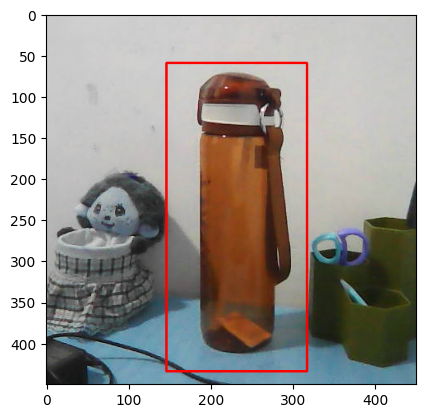

In [31]:
cv2.rectangle(augmented['image'], 
              tuple(np.multiply(augmented['bboxes'][0][:2], [450,450]).astype(int)),
              tuple(np.multiply(augmented['bboxes'][0][2:], [450,450]).astype(int)), 
                    (255,0,0), 2)

plt.imshow(augmented['image'])

In [34]:
for partition in ['train','test','val']: 
    for image in os.listdir(os.path.join('data', partition, 'images')):
        img = cv2.imread(os.path.join('data', partition, 'images', image))

        coords = [0,0,0.00001,0.00001]
        label_path = os.path.join('data', partition, 'labels', f'{image.split(".")[0]}.json')
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                label = json.load(f)

            coords[0] = label['shapes'][0]['points'][0][0]
            coords[1] = label['shapes'][0]['points'][0][1]
            coords[2] = label['shapes'][0]['points'][1][0]
            coords[3] = label['shapes'][0]['points'][1][1]
            coords = list(np.divide(coords, [640,480,640,480]))

        try: 
            for x in range(60):
                augmented = augmentor(image=img, bboxes=[coords], class_labels=['face'])
                cv2.imwrite(os.path.join('aug_data', partition, 'images', f'{image.split(".")[0]}.{x}.jpg'), augmented['image'])

                annotation = {}
                annotation['image'] = image

                if os.path.exists(label_path):
                    if len(augmented['bboxes']) == 0: 
                        annotation['bbox'] = [0,0,0,0]
                        annotation['class'] = 0 
                    else: 
                        annotation['bbox'] = augmented['bboxes'][0]
                        annotation['class'] = 1
                else: 
                    annotation['bbox'] = [0,0,0,0]
                    annotation['class'] = 0 


                with open(os.path.join('aug_data', partition, 'labels', f'{image.split(".")[0]}.{x}.json'), 'w') as f:
                    json.dump(annotation, f)

        except Exception as e:
            print(e)

#### Loading images to Tensorflow dataset 

In [35]:
train_images = tf.data.Dataset.list_files('aug_data\\train\\images\\*.jpg', shuffle=False)
train_images = train_images.map(load_image)
train_images = train_images.map(lambda x: tf.image.resize(x, (120,120)))
train_images = train_images.map(lambda x: x/255)

In [36]:
test_images = tf.data.Dataset.list_files('aug_data\\test\\images\\*.jpg', shuffle=False)
test_images = test_images.map(load_image)
test_images = test_images.map(lambda x: tf.image.resize(x, (120,120)))
test_images = test_images.map(lambda x: x/255)

In [37]:
val_images = tf.data.Dataset.list_files('aug_data\\val\\images\\*.jpg', shuffle=False)
val_images = val_images.map(load_image)
val_images = val_images.map(lambda x: tf.image.resize(x, (120,120)))
val_images = val_images.map(lambda x: x/255)

In [38]:
train_images.as_numpy_iterator().next()

array([[[0.80245095, 0.80245095, 0.80245095],
        [0.80373776, 0.80373776, 0.80373776],
        [0.8039216 , 0.8039216 , 0.8039216 ],
        ...,
        [0.74509805, 0.7529412 , 0.7490196 ],
        [0.7490196 , 0.75686276, 0.7529412 ],
        [0.7481005 , 0.75594366, 0.7520221 ]],

       [[0.80441177, 0.80441177, 0.80441177],
        [0.80441177, 0.80441177, 0.80441177],
        [0.8039216 , 0.8039216 , 0.8039216 ],
        ...,
        [0.7529412 , 0.7607843 , 0.75686276],
        [0.7529412 , 0.7607843 , 0.75686276],
        [0.7504902 , 0.7583333 , 0.75441176]],

       [[0.80441177, 0.80441177, 0.80441177],
        [0.80441177, 0.80441177, 0.80441177],
        [0.8009804 , 0.8009804 , 0.8009804 ],
        ...,
        [0.7529412 , 0.7607843 , 0.75686276],
        [0.7490196 , 0.75686276, 0.7529412 ],
        [0.75147057, 0.7593137 , 0.75539213]],

       ...,

       [[0.35955882, 0.32916668, 0.25012255],
        [0.5504902 , 0.49699754, 0.37015933],
        [0.48786765, 0

#### Preparing labels 

In [39]:
def load_labels(label_path):
    with open(label_path.numpy(), 'r', encoding = "utf-8") as f:
        label = json.load(f)
        
    return [label['class']], label['bbox']

In [40]:
train_labels = tf.data.Dataset.list_files('aug_data\\train\\labels\\*.json', shuffle=False)
train_labels = train_labels.map(lambda x: tf.py_function(load_labels, [x], [tf.uint8, tf.float16]))
test_labels = tf.data.Dataset.list_files('aug_data\\test\\labels\\*.json', shuffle=False)
test_labels = test_labels.map(lambda x: tf.py_function(load_labels, [x], [tf.uint8, tf.float16]))
val_labels = tf.data.Dataset.list_files('aug_data\\val\\labels\\*.json', shuffle=False)
val_labels = val_labels.map(lambda x: tf.py_function(load_labels, [x], [tf.uint8, tf.float16]))
train_labels.as_numpy_iterator().next()

(array([1], dtype=uint8),
 array([0.1571, 0.0989, 0.5356, 0.932 ], dtype=float16))

In [41]:
len(train_images), len(train_labels), len(test_images), len(test_labels), len(val_images), len(val_labels)

(2400, 2400, 600, 600, 600, 600)

In [42]:
train = tf.data.Dataset.zip((train_images, train_labels))
train = train.shuffle(5000)
train = train.batch(8)
train = train.prefetch(4)
test = tf.data.Dataset.zip((test_images, test_labels))
test = test.shuffle(1300)
test = test.batch(8)
test = test.prefetch(4)
val = tf.data.Dataset.zip((val_images, val_labels))
val = val.shuffle(1000)
val = val.batch(8)
val = val.prefetch(4)
train.as_numpy_iterator().next()[1]

(array([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1]], dtype=uint8),
 array([[0.2524 , 0.     , 0.9316 , 0.7583 ],
        [0.1455 , 0.1318 , 0.4583 , 0.9424 ],
        [0.     , 0.08813, 0.673  , 0.7075 ],
        [0.0773 , 0.134  , 0.3818 , 0.9243 ],
        [0.1154 , 0.1588 , 0.4385 , 0.9385 ],
        [0.371  , 0.1456 , 0.6675 , 0.944  ],
        [0.2021 , 0.1628 , 0.5806 , 0.961  ],
        [0.2213 , 0.1163 , 0.5483 , 0.9126 ]], dtype=float16))

In [43]:
data_samples = train.as_numpy_iterator()

In [44]:
res = data_samples.next()

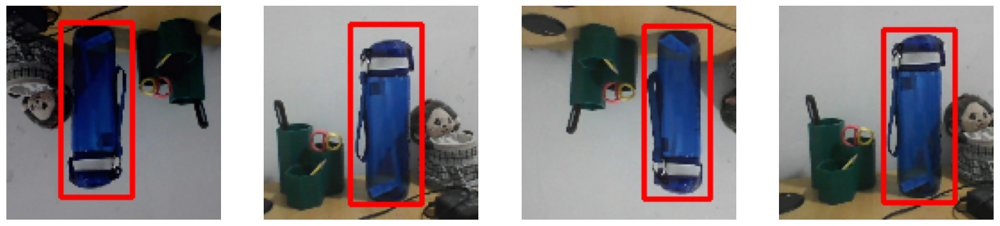

In [45]:
fig, ax = plt.subplots(ncols=4, figsize=(20, 20))

for idx in range(4):
    # Load the sample image and coordinates for each index
    sample_image = res[0][idx]
    sample_coords = res[1][1][idx]

    # Make a writable copy of the sample image
    sample_image_writable = sample_image.copy()

    # Ensure correct dtype for OpenCV
    if sample_image_writable.dtype != np.uint8:
        sample_image_writable = (sample_image_writable * 255).astype(np.uint8)

    # Calculate and clip coordinates
    x1, y1, x2, y2 = np.multiply(sample_coords, [120, 120, 120, 120]).astype(int)
    x1, y1 = np.clip([x1, y1], 0, 119)
    x2, y2 = np.clip([x2, y2], 0, 119)

    # Draw the rectangle
    cv2.rectangle(sample_image_writable, (x1, y1), (x2, y2), (255, 0, 0), 2)

    # Display the image
    ax[idx].imshow(sample_image_writable)
    ax[idx].axis('off')  # Hide axes for better visualization

plt.show()


#### Deep learning using Functional API 

In [ ]:
#vgg = VGG16(include_top=False)
#vgg.summary()

VGG16 is a convolutional neural network architecture developed by the Visual Geometry Group (VGG) at the University of Oxford. It gained prominence through its success in the ImageNet Large Scale Visual Recognition Challenge (ILSVRC) 2014, where it achieved high classification accuracy.

The architecture emphasizes simplicity by using small (3x3) convolutional filters stacked deeply, which significantly increased depth compared to earlier models like AlexNet.

In [46]:
def build_model(): 
    input_layer = Input(shape=(120,120,3))
    
    vgg = VGG16(include_top=False)(input_layer)

    # Classification Model  
    f1 = GlobalMaxPooling2D()(vgg)
    class1 = Dense(2048, activation='relu')(f1)
    class2 = Dense(1, activation='sigmoid')(class1)
    
    # Bounding box model
    f2 = GlobalMaxPooling2D()(vgg)
    regress1 = Dense(2048, activation='relu')(f2)
    regress2 = Dense(4, activation='sigmoid')(regress1)
    
    facetracker = Model(inputs=input_layer, outputs=[class2, regress2])
    return facetracker

In [47]:
facetracker = build_model()

In [48]:
facetracker.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 120, 120, 3)]        0         []                            
                                                                                                  
 vgg16 (Functional)          (None, None, None, 512)      1471468   ['input_1[0][0]']             
                                                          8                                       
                                                                                                  
 global_max_pooling2d (Glob  (None, 512)                  0         ['vgg16[0][0]']               
 alMaxPooling2D)                                                                                  
                                                                                              

In [49]:
X, y = train.as_numpy_iterator().next()

In [50]:
X.shape

(8, 120, 120, 3)

In [51]:
classes, coords = facetracker.predict(X)

1/1 [==============================] - 1s 1s/step


In [52]:
classes, coords

(array([[0.38783482],
        [0.3892732 ],
        [0.43069503],
        [0.42737123],
        [0.3613545 ],
        [0.5060621 ],
        [0.34366575],
        [0.49127865]], dtype=float32),
 array([[0.44585645, 0.5528722 , 0.49129814, 0.43531743],
        [0.4179742 , 0.49031228, 0.41125217, 0.42728043],
        [0.45875293, 0.4166078 , 0.43532342, 0.41257468],
        [0.4174557 , 0.4311471 , 0.5075688 , 0.48798645],
        [0.45705938, 0.5024599 , 0.38960746, 0.4181853 ],
        [0.5276343 , 0.46350577, 0.46935484, 0.38179544],
        [0.41810316, 0.4960652 , 0.4652511 , 0.43098813],
        [0.49601084, 0.5187524 , 0.5188434 , 0.41783032]], dtype=float32))

In [53]:
batches_per_epoch = len(train)
lr_decay = (1./0.75 -1)/batches_per_epoch

In [54]:
# Define a learning rate schedule
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.0001,
    decay_steps=10000,  # Adjust based on your needs
    decay_rate=0.96,    # Adjust based on your needs
    staircase=False     # Set to True for stepwise decay
)

# Pass the learning rate schedule to the optimizer
opt = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

In [55]:
def localization_loss(y_true, yhat):            
    delta_coord = tf.reduce_sum(tf.square(y_true[:,:2] - yhat[:,:2]))
                  
    h_true = y_true[:,3] - y_true[:,1] 
    w_true = y_true[:,2] - y_true[:,0] 

    h_pred = yhat[:,3] - yhat[:,1] 
    w_pred = yhat[:,2] - yhat[:,0] 
    
    delta_size = tf.reduce_sum(tf.square(w_true - w_pred) + tf.square(h_true-h_pred))
    
    return delta_coord + delta_size

In [56]:
classloss = tf.keras.losses.BinaryCrossentropy()
regressloss = localization_loss

In [57]:
localization_loss(y[1], coords)

<tf.Tensor: shape=(), dtype=float32, numpy=8.596269>

In [58]:
classloss(y[0], classes)

<tf.Tensor: shape=(), dtype=float32, numpy=0.8826158>

In [59]:
regressloss(y[1], coords)

<tf.Tensor: shape=(), dtype=float32, numpy=8.596269>

#### Training the Neural Network 

In [63]:
class FaceTracker(Model): 
    def __init__(self, eyetracker,  **kwargs): 
        super().__init__(**kwargs)
        self.model = eyetracker

    def compile(self, opt, classloss, localizationloss, **kwargs):
        super().compile(**kwargs)
        self.closs = classloss
        self.lloss = localizationloss
        self.opt = opt
    
    def train_step(self, batch, **kwargs): 
        
        X, y = batch
        
        with tf.GradientTape() as tape: 
            classes, coords = self.model(X, training=True)
            
            batch_classloss = self.closs(y[0], classes)
            batch_localizationloss = self.lloss(tf.cast(y[1], tf.float32), coords)
            
            total_loss = batch_localizationloss+0.5*batch_classloss
            
            grad = tape.gradient(total_loss, self.model.trainable_variables)
        
        opt.apply_gradients(zip(grad, self.model.trainable_variables))
        
        return {"total_loss":total_loss, "class_loss":batch_classloss, "regress_loss":batch_localizationloss}
    
    def test_step(self, batch, **kwargs): 
        X, y = batch
        
        classes, coords = self.model(X, training=False)
        
        batch_classloss = self.closs(y[0], classes)
        batch_localizationloss = self.lloss(tf.cast(y[1], tf.float32), coords)
        total_loss = batch_localizationloss+0.5*batch_classloss
        
        return {"total_loss":total_loss, "class_loss":batch_classloss, "regress_loss":batch_localizationloss}
        
    def call(self, X, **kwargs): 
        return self.model(X, **kwargs)

In [64]:
model = FaceTracker(facetracker)

In [65]:
model.compile(opt, classloss, regressloss)

In [66]:
logdir='logs'

In [67]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [68]:
hist = model.fit(train, epochs=10, validation_data=val, callbacks=[tensorboard_callback])

Epoch 1/10
300/300 [==============================] - 623s 2s/step - total_loss: 0.1363 - class_loss: 0.0064 - regress_loss: 0.1331 - val_total_loss: 0.0233 - val_class_loss: 1.5520e-05 - val_regress_loss: 0.0233
Epoch 2/10
300/300 [==============================] - 624s 2s/step - total_loss: 0.0243 - class_loss: 5.9353e-06 - regress_loss: 0.0243 - val_total_loss: 0.0392 - val_class_loss: 1.5125e-06 - val_regress_loss: 0.0392
Epoch 3/10
300/300 [==============================] - 529s 2s/step - total_loss: 0.0215 - class_loss: 2.8968e-06 - regress_loss: 0.0215 - val_total_loss: 0.0378 - val_class_loss: 4.3958e-07 - val_regress_loss: 0.0378
Epoch 4/10
300/300 [==============================] - 527s 2s/step - total_loss: 0.0187 - class_loss: 9.7385e-07 - regress_loss: 0.0187 - val_total_loss: 0.0244 - val_class_loss: 1.4380e-06 - val_regress_loss: 0.0244
Epoch 5/10
300/300 [==============================] - 524s 2s/step - total_loss: 0.0156 - class_loss: 8.6155e-07 - regress_loss: 0.0156 

In [69]:
hist.history

{'total_loss': [0.031130775809288025,
  0.025762364268302917,
  0.013567514717578888,
  0.031677763909101486,
  0.00721219927072525,
  0.009565223939716816,
  0.012808502651751041,
  0.009045273065567017,
  0.006834621541202068,
  0.008878744207322598],
 'class_loss': [1.3537872291635722e-05,
  8.121139103423047e-07,
  8.344657089764951e-07,
  3.203750509328529e-07,
  2.3841863594498136e-07,
  2.7567159577301936e-07,
  3.725290653733282e-08,
  1.7881399116959074e-07,
  3.799797525516624e-07,
  1.6391288681916194e-07],
 'regress_loss': [0.03112400695681572,
  0.025761958211660385,
  0.01356709748506546,
  0.03167760372161865,
  0.0072120800614356995,
  0.009565086103975773,
  0.012808484025299549,
  0.009045183658599854,
  0.006834431551396847,
  0.008878662250936031],
 'val_total_loss': [0.023333340883255005,
  0.03920651599764824,
  0.03783947601914406,
  0.024381503462791443,
  0.01748829521238804,
  0.027124740183353424,
  0.02910749241709709,
  0.015280427411198616,
  0.02077544294

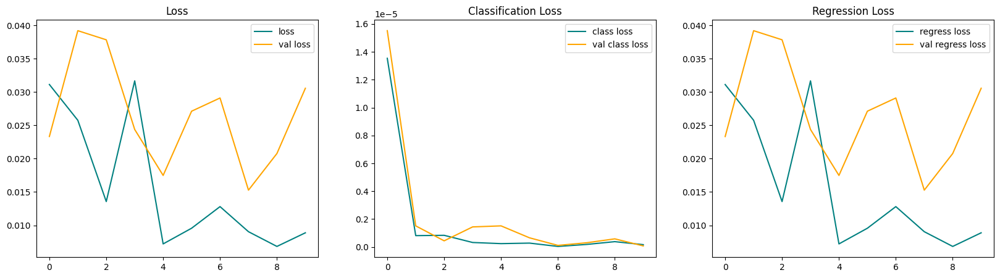

In [70]:
fig, ax = plt.subplots(ncols=3, figsize=(20,5))

ax[0].plot(hist.history['total_loss'], color='teal', label='loss')
ax[0].plot(hist.history['val_total_loss'], color='orange', label='val loss')
ax[0].title.set_text('Loss')
ax[0].legend()

ax[1].plot(hist.history['class_loss'], color='teal', label='class loss')
ax[1].plot(hist.history['val_class_loss'], color='orange', label='val class loss')
ax[1].title.set_text('Classification Loss')
ax[1].legend()

ax[2].plot(hist.history['regress_loss'], color='teal', label='regress loss')
ax[2].plot(hist.history['val_regress_loss'], color='orange', label='val regress loss')
ax[2].title.set_text('Regression Loss')
ax[2].legend()

plt.show()

#### Making Predictions on Test Data 

In [71]:
test_data = test.as_numpy_iterator()

In [72]:
test_sample = test_data.next()

In [73]:
yhat = facetracker.predict(test_sample[0])

1/1 [==============================] - 0s 405ms/step


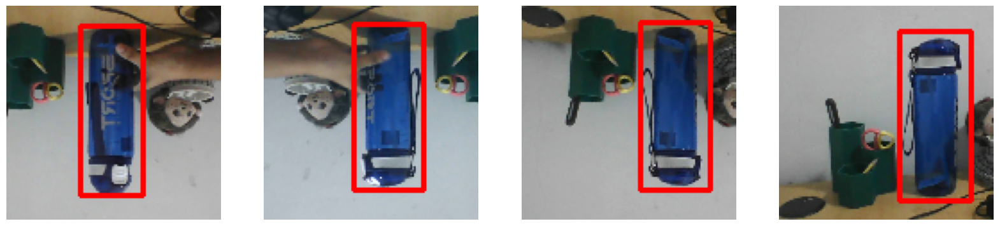

In [74]:
fig, ax = plt.subplots(ncols=4, figsize=(20, 20))

for idx in range(4): 
    sample_image = test_sample[0][idx]
    sample_coords = yhat[1][idx]
    
    # Create a writable copy of the image
    sample_image_writable = sample_image.copy()

    # Ensure the image is in the correct dtype (uint8) for OpenCV
    if sample_image_writable.dtype != np.uint8:
        sample_image_writable = (sample_image_writable * 255).astype(np.uint8)
    
    if yhat[0][idx] > 0.9:
        # Draw rectangle
        cv2.rectangle(
            sample_image_writable, 
            tuple(np.multiply(sample_coords[:2], [120, 120]).astype(int)),
            tuple(np.multiply(sample_coords[2:], [120, 120]).astype(int)), 
            (255, 0, 0), 
            2
        )
    
    # Display the image
    ax[idx].imshow(sample_image_writable)
    ax[idx].axis('off')  # Hide the axis for better visualization

plt.show()


In [75]:
facetracker.save('facetracker.h5')

C:\Users\nadha\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [76]:
facetracker = load_model('facetracker.h5')

#### Real Time Detection 

In [77]:
# Initialize the webcam
cap = cv2.VideoCapture(0)

# Ensure the camera is initialized
time.sleep(2)

# Create a tkinter window
root = tk.Tk()
root.title("Object Detection")

# Create a label to display the webcam feed
label = tk.Label(root)
label.pack()

# Load your face detection model
# Assuming `facetracker` is your pre-trained model (replace with your actual model)
# facetracker = tf.keras.models.load_model('your_model.h5')  # Example loading code

def show_frame():
    # Capture frame from webcam
    ret, frame = cap.read()
    if not ret or frame is None:
        print("Failed to capture frame")
        return
    
    # Crop and resize the frame for processing
    frame = frame[50:500, 50:500, :]
    
    # Convert the frame from BGR to RGB
    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    resized = tf.image.resize(rgb, (120, 120))
    
    # Run the face detection model
    yhat = facetracker.predict(np.expand_dims(resized / 255.0, 0))
    sample_coords = yhat[1][0]  # Assuming the output contains coordinates

    if yhat[0] > 0.5:  # If a face is detected (confidence > 0.5)
        # Draw the main rectangle around the face
        cv2.rectangle(frame, 
                      tuple(np.multiply(sample_coords[:2], [450, 450]).astype(int)),
                      tuple(np.multiply(sample_coords[2:], [450, 450]).astype(int)), 
                      (255, 0, 0), 2)

        # Draw the label rectangle
        cv2.rectangle(frame, 
                      tuple(np.add(np.multiply(sample_coords[:2], [450, 450]).astype(int), [0, -30])),
                      tuple(np.add(np.multiply(sample_coords[:2], [450, 450]).astype(int), [80, 0])), 
                      (255, 0, 0), -1)

        # Draw the text label
        cv2.putText(frame, 'bottle', 
                    tuple(np.add(np.multiply(sample_coords[:2], [450, 450]).astype(int), [0, -5])),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

    # Convert the frame to a format suitable for Tkinter
    img = Image.fromarray(frame)
    imgtk = ImageTk.PhotoImage(image=img)
    
    # Update the label with the new frame
    label.imgtk = imgtk
    label.configure(image=imgtk)

    # Call show_frame again after 10ms to update the video feed
    label.after(10, show_frame)

# Start the video feed
show_frame()

# Run the Tkinter main loop
root.mainloop()

# Release the camera when the window is closed
cap.release()
cv2.destroyAllWindows()


1/1 [==============================] - 0s 89ms/step


![Image](test.png)


In [82]:
from IPython.display import Video, display

# For a local video
display(Video(filename='testvideo.mp4', embed=True))